In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/after/1.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/after/3.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/after/2.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/before/1.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/before/3.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/photofacials-3/before/2.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/permanent-cosmetics-6/after/6.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/permanent-cosmetics-6/after/5.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/permanent-cosmetics-6/after/1.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/permanent-cosmetics-6/after/4.jpg
/kaggle/input/image-file/Plastic Face-Database/plastic face/permanent-cosmetics-6/after/3.jpg
/kagg

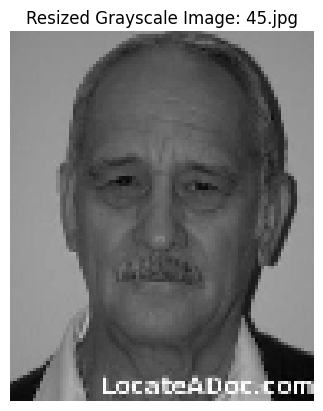

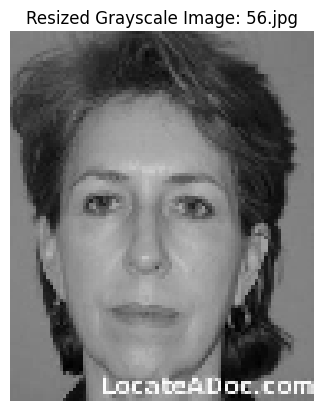

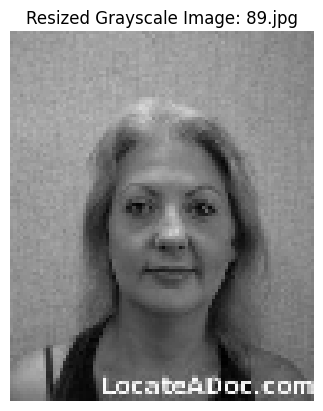

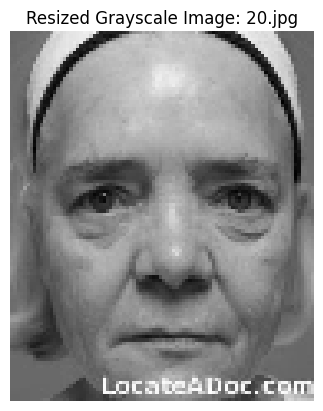

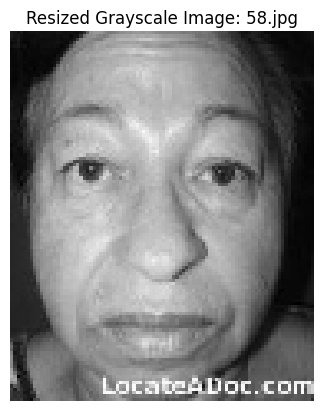

...

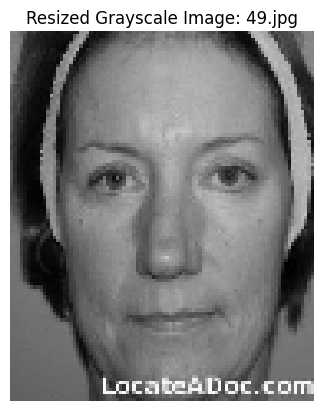

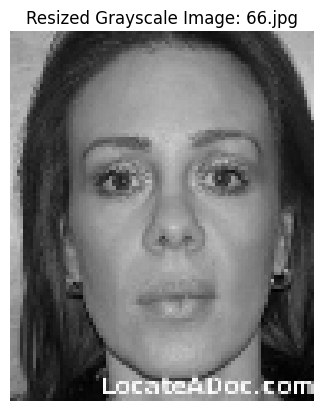

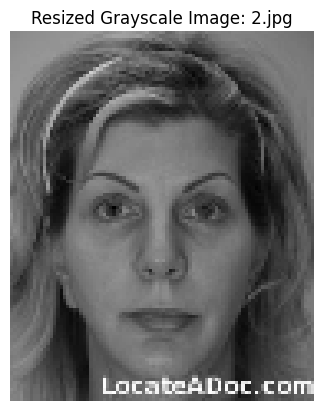

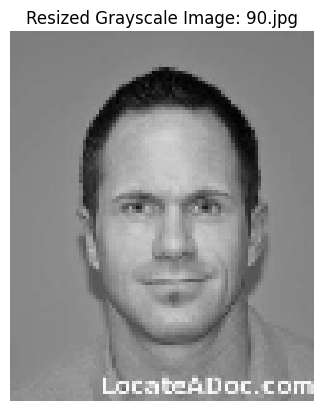

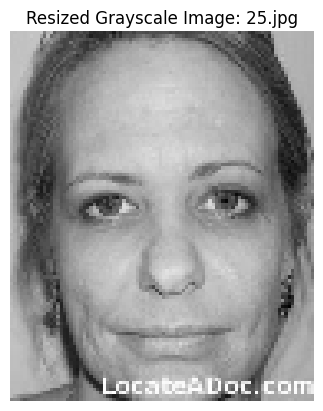

LBP features saved to lbp_features_eyelid.csv


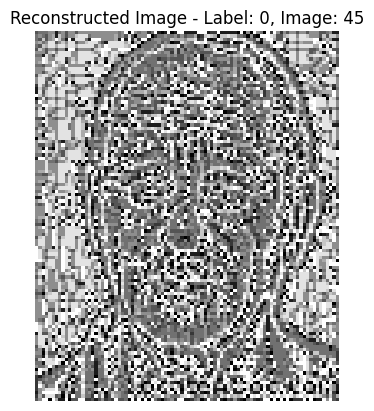

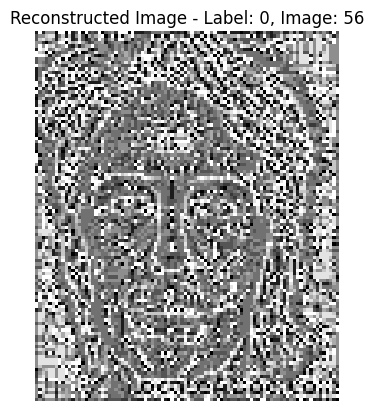

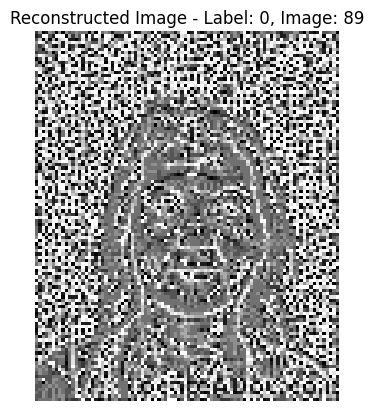

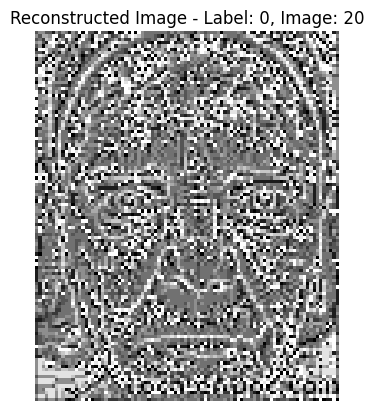

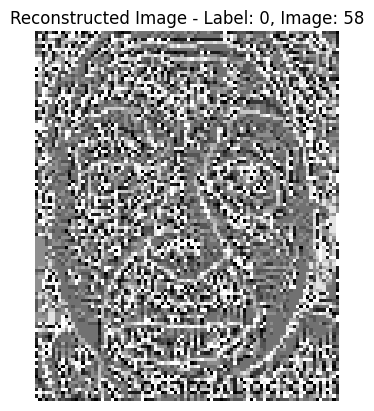

...

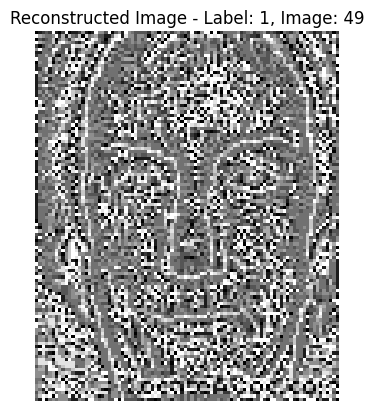

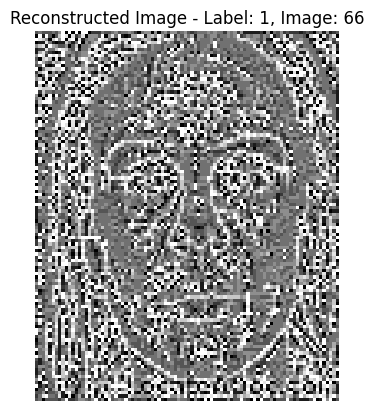

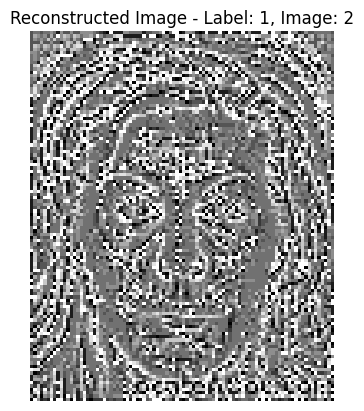

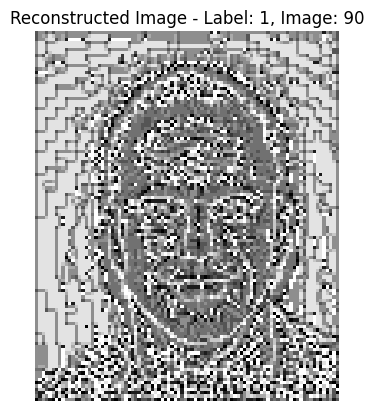

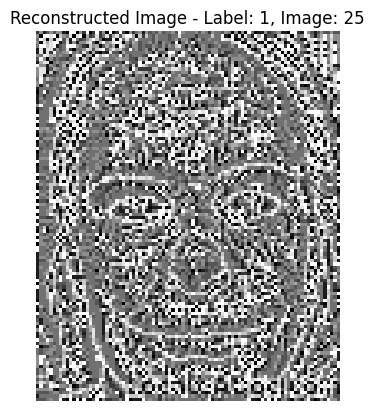

In [2]:
import cv2
import os
import numpy as np
from skimage.feature import local_binary_pattern
import pandas as pd
import matplotlib.pyplot as plt

# Parameters for LBP
radius = 1  # LBP circle radius
n_points = 8 * radius  # Number of points for LBP

# Directories containing before and after images
before_dir = "/kaggle/input/image-file/Plastic Face-Database/plastic face/blepharoplasty-eyelid-surgery-92/before"  # Replace with the actual path
after_dir = "/kaggle/input/image-file/Plastic Face-Database/plastic face/blepharoplasty-eyelid-surgery-92/after"  # Replace with the actual path

# Output CSV
output_csv = "lbp_features_eyelid.csv"

# Initialize list to store LBP features
lbp_features = []

def process_images(image_dir, label):
    """
    Processes images in a directory, converts them to grayscale, resizes them, 
    computes LBP for each image, and stores features.

    :param image_dir: Directory containing images
    :param label: Label to assign to images (e.g., 0 for 'before', 1 for 'after')
    """
    global lbp_features
    
    # Check if directory exists
    if not os.path.exists(image_dir):
        print(f"Directory not found: {image_dir}")
        return

    for filename in os.listdir(image_dir):
        if filename.lower().endswith((".jpg", ".png", ".jpeg")):
            # Extract image number from filename
            image_number = os.path.splitext(filename)[0]

            # Load image
            image_path = os.path.join(image_dir, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            
            if image is None:
                print(f"Error loading image: {filename}")
                continue

            # Resize image to 92x112
            resized_image = cv2.resize(image, (92, 112))

            # Display the resized grayscale image
            plt.imshow(resized_image, cmap='gray')
            plt.title(f"Resized Grayscale Image: {filename}")
            plt.axis('off')
            plt.show()

            # Apply LBP
            lbp = local_binary_pattern(resized_image, n_points, radius, method="uniform")

            # Flatten LBP matrix to a single row
            lbp_flattened = lbp.flatten()

            # Append to features with label and image number
            lbp_features.append(np.concatenate(([label, int(image_number)], lbp_flattened)))

# Function to reconstruct and display images from CSV pixel values
def reconstruct_images_from_csv(csv_file):
    """
    Reads LBP features from a CSV file and reconstructs images to verify pixel values.

    :param csv_file: Path to the CSV file containing LBP features
    """
    try:
        # Load the CSV
        df = pd.read_csv(csv_file)

        for index, row in df.iterrows():
            label = row["label"]  # Extract label
            image_number = row["image_number"]  # Extract image number
            pixels = row[2:].values  # Extract pixel values

            # Reshape the pixel array back to the original image size (92x112)
            image = pixels.reshape((112, 92))

            # Display the reconstructed image
            plt.imshow(image, cmap='gray')
            plt.title(f"Reconstructed Image - Label: {int(label)}, Image: {int(image_number)}")
            plt.axis('off')
            plt.show()

    except Exception as e:
        print(f"Error reading or reconstructing images from CSV: {e}")

# Process 'before' images with label 0
process_images(before_dir, label=0)

# Process 'after' images with label 1
process_images(after_dir, label=1)

# Check if features were extracted
if not lbp_features:
    print("No features were extracted. Please check your image directories.")
else:
    # Convert to DataFrame
    columns = ["label", "image_number"] + [f"pixel_{i}" for i in range(len(lbp_features[0]) - 2)]
    df = pd.DataFrame(lbp_features, columns=columns)

    # Save to CSV
    try:
        df.to_csv(output_csv, index=False)
        print(f"LBP features saved to {output_csv}")
    except Exception as e:
        print(f"Error saving CSV: {e}")

    # Reconstruct and display images from the CSV
    reconstruct_images_from_csv(output_csv)